<div align='left'><font size='5' color='#5b2c6f '> OPTIMIZING ONLINE FRAUD DETECTION</font></div>

- In this notebook we will implement a machine learning model to detect fraud. There are several challenges with the dataset. 
- Following steps and methodologies will be taken to build the model.
- [Loading Libraries]
- [Loading Data ]
- [The metric trap]
- [Data preparating]
- [Resampling]
- [Resampling using sklearn]
- [Dimensionality Reduction and Clustering]
- [Algorithmic Ensemble Techniques]

### [Loading Required libraries](#1)<a id="1"></a> <br>

In [1]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.preprocessing import LabelEncoder
from sklearn.preprocessing import StandardScaler
from sklearn.utils import resample
from xgboost import XGBClassifier
from sklearn.metrics import roc_auc_score,precision_recall_curve,roc_curve
from sklearn.model_selection import train_test_split
from sklearn.linear_model import LogisticRegression
from sklearn.manifold import TSNE
from sklearn.decomposition import PCA, TruncatedSVD
import time
import matplotlib.patches as mpatches
from sklearn.metrics import confusion_matrix


In [2]:
#!echo 1 > /proc/sys/vm/overcommit_memory
from sklearn.impute import SimpleImputer
from sklearn.compose import ColumnTransformer
from sklearn.compose import make_column_selector
from sklearn.svm import SVC
from sklearn.naive_bayes import GaussianNB
from sklearn.metrics import accuracy_score
from sklearn.svm import SVC
from sklearn.metrics import accuracy_score
from sklearn.feature_selection import SelectKBest, chi2


from scipy import stats
from xgboost import XGBClassifier
from sklearn.model_selection import RandomizedSearchCV, KFold, GridSearchCV
from sklearn.metrics import f1_score
# DictVectorizer
from sklearn.feature_extraction import DictVectorizer



In [3]:
# Any results you write to the current directory are saved as output.
import pandas as pd
import numpy as np
import os
from sklearn.preprocessing import StandardScaler
from sklearn.model_selection import train_test_split
from sklearn import metrics
from sklearn.metrics import f1_score, roc_auc_score,accuracy_score,confusion_matrix,classification_report, make_scorer,precision_recall_fscore_support,precision_score,recall_score
from sklearn.linear_model import LogisticRegression
from sklearn.ensemble import RandomForestClassifier,ExtraTreesClassifier
from sklearn.model_selection import GridSearchCV, StratifiedKFold,cross_val_score
from sklearn.neural_network import MLPClassifier
#from imblearn.pipeline import make_pipeline as make_pipeline_imb
#from imblearn.over_sampling import SMOTE
#from imblearn.metrics import classification_report_imbalanced
from sklearn.feature_selection import VarianceThreshold
from sklearn.feature_selection import RFE
import xgboost as xgb
from xgboost import XGBClassifier
import pandas as pd
import matplotlib.pyplot as plt
from collections import Counter
import time

## Loading Data

In [4]:
%%time 
train_transactions=pd.read_csv('../ieee-fraud-detection/train_transaction.csv')
train_identity=pd.read_csv('../ieee-fraud-detection/train_identity.csv')
print('Train data set is loaded !')

Train data set is loaded !
Wall time: 19 s


In [5]:
final = pd.read_csv('./final_file.csv') #imputed columns
final_encoded = pd.read_csv('./final_encoded.csv') # encoded columns with dictvectorizer
rfe_ds = pd.read_csv('./rfe_ds.csv') #reduction of dimensions using rfe 


<div align='left'><font size='4' color='#229954'>Data Pre-Processing and preparation </font></div>

In [39]:
pd.set_option('display.max_rows', 1000)
pd.set_option('display.max_columns', 500)
pd.set_option('display.width', 1000)
pd.set_option('display.max_colwidth',True)
pd.set_option('display.expand_frame_repr', True)
pd.set_option('display.precision', 100)


In [18]:
pd1 = pd.Series(rfe_ds.columns)
pd1 = pd1[pd1=='card2']

In [6]:
train_transactions.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 590540 entries, 0 to 590539
Columns: 394 entries, TransactionID to V339
dtypes: float64(376), int64(4), object(14)
memory usage: 1.7+ GB


In [7]:
train_identity.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 144233 entries, 0 to 144232
Data columns (total 41 columns):
 #   Column         Non-Null Count   Dtype  
---  ------         --------------   -----  
 0   TransactionID  144233 non-null  int64  
 1   id_01          144233 non-null  float64
 2   id_02          140872 non-null  float64
 3   id_03          66324 non-null   float64
 4   id_04          66324 non-null   float64
 5   id_05          136865 non-null  float64
 6   id_06          136865 non-null  float64
 7   id_07          5155 non-null    float64
 8   id_08          5155 non-null    float64
 9   id_09          74926 non-null   float64
 10  id_10          74926 non-null   float64
 11  id_11          140978 non-null  float64
 12  id_12          144233 non-null  object 
 13  id_13          127320 non-null  float64
 14  id_14          80044 non-null   float64
 15  id_15          140985 non-null  object 
 16  id_16          129340 non-null  object 
 17  id_17          139369 non-nul

<div align='left'><font size='4' color='#229954'>Target variable</font></div>


Text(0.5, 1.0, 'Target variable count')

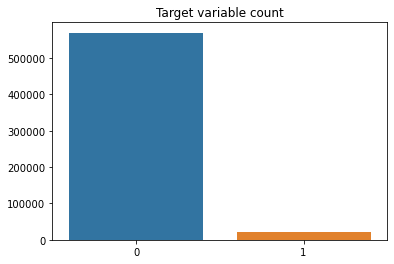

In [8]:
x=train_transactions['isFraud'].value_counts().values
sns.barplot([0,1],x)
plt.title('Target variable count')


- There is clearly a class imbalace problem.
- We will look into methods of solving this issue later in this notebook.

## [The metric trap](#3)<a id="3"></a> <br>

 Using simpler metrics like accuracy_score can be misleading. In a dataset with highly unbalanced classes, if the classifier always "predicts" the most common class without performing any analysis of the features, it will still have a high accuracy rate, obviously illusory.


    False Positive. Predict an event when there was no event.
    False Negative. Predict no event when in fact there was an event.

   In the overview of the problem statement the organizers has described a situation where you stand at the queue for a long time and when your chance arrives,the transaction gets denied because it was interpreted as a Fraudulent transaction which many of us have faced.
 This is classical example of **False Negative** prediction.
 


**Change the performance metric**

As we saw above, accuracy is not the best metric to use when evaluating imbalanced datasets as it can be very misleading. Metrics that can provide better insight include:

**Confusion Matrix**: a table showing correct predictions and types of incorrect predictions.
    
**Precision**: the number of true positives divided by all positive predictions. Precision is also called Positive Predictive Value. It is a measure of a classifier’s exactness. Low precision indicates a high number of false positives.
    
**Recall**: the number of true positives divided by the number of positive values in the test data. Recall is also called Sensitivity or the True Positive Rate. It is a measure of a classifier’s completeness. Low recall indicates a high number of false negatives.
    
**F1 Score**: the weighted average of precision and recall.
    

## [Merging transaction and identity dataset](#4)<a id="4"></a> <br>

We will firt merge our **transactions** and **identity** datasets.

In [9]:
train=train_transactions.merge(train_identity,how='left',left_index=True,right_index=True)
y_train=train['isFraud'].astype('uint8')
print('Train shape',train.shape)



del train_transactions,train_identity

print("Data set merged ")



Train shape (590540, 435)
Data set merged 


In [24]:
test=test_transactions.merge(test_identity,how='left',left_index=True,right_index=True)
print('test shape',test.shape)



del test_transactions,test_identity

print("Data set merged ")



test shape (506691, 434)
Data set merged 


<div align='left'><font size='4' color='#229954'>Reducing memory usage</font></div>



In [10]:


%%time
# From kernel https://www.kaggle.com/gemartin/load-data-reduce-memory-usage
# WARNING! THIS CAN DAMAGE THE DATA 
def reduce_mem_usage2(df):
    """ iterate through all the columns of a dataframe and modify the data type
        to reduce memory usage.        
    """
    start_mem = df.memory_usage().sum() / 1024**2
    print('Memory usage of dataframe is {:.2f} MB'.format(start_mem))
    
    for col in df.columns:
        col_type = df[col].dtype
        
        if col_type != object:
            c_min = df[col].min()
            c_max = df[col].max()
            if str(col_type)[:3] == 'int':
                if c_min > np.iinfo(np.int8).min and c_max < np.iinfo(np.int8).max:
                    df[col] = df[col].astype(np.int8)
                elif c_min > np.iinfo(np.int16).min and c_max < np.iinfo(np.int16).max:
                    df[col] = df[col].astype(np.int16)
                elif c_min > np.iinfo(np.int32).min and c_max < np.iinfo(np.int32).max:
                    df[col] = df[col].astype(np.int32)
                elif c_min > np.iinfo(np.int64).min and c_max < np.iinfo(np.int64).max:
                    df[col] = df[col].astype(np.int64)  
            else:
                if c_min > np.finfo(np.float16).min and c_max < np.finfo(np.float16).max:
                    df[col] = df[col].astype(np.float16)
                elif c_min > np.finfo(np.float32).min and c_max < np.finfo(np.float32).max:
                    df[col] = df[col].astype(np.float32)
                else:
                    df[col] = df[col].astype(np.float64)
        else:
            df[col] = df[col].astype('object')

    end_mem = df.memory_usage().sum() / 1024**2
    print('Memory usage after optimization is: {:.2f} MB'.format(end_mem))
    print('Decreased by {:.1f}%'.format(100 * (start_mem - end_mem) / start_mem))
    
    return df



Wall time: 0 ns
Parser   : 690 ms


In [11]:


%%time
train = reduce_mem_usage2(train)




Memory usage of dataframe is 1959.88 MB
Memory usage after optimization is: 648.22 MB
Decreased by 66.9%
Wall time: 2min 36s


In [31]:

%%time
test = reduce_mem_usage2(test)


Memory usage of dataframe is 1677.73 MB
Memory usage after optimization is: 563.43 MB
Decreased by 66.4%
Wall time: 4min 10s


<div align='left'><font size='4' color='#229954'>Splitting to train and validation</font></div>


In [10]:
y_train = train['isFraud']

- We will now split the train dataset into train and validation set.
- We will keeep 20% of data for validation.

In [16]:
X_train,X_val,y_train,y_val=train_test_split(train.drop('isFraud',axis=1),y_train,test_size=.2,random_state=1)


## [Resampling](#5)<a id="5"></a> <br>

A widely adopted technique for dealing with highly unbalanced datasets is called resampling. It consists of removing samples from the majority class (under-sampling) and / or adding more examples from the minority class (over-sampling).

We will leverage undersampling technique for making dataset balanced.



## [Resampling Techniques using sklearn](#6)<a id="6"></a> <br>

In [17]:
X_train.shape

(472432, 434)

In [18]:
sp = SimpleImputer(strategy="most_frequent")
sp2 = SimpleImputer(strategy="median")

<div align='left'><font size='4' color=' #6c3483'>  2. Undersample majority class </font></div>


Undersampling can be defined as removing some observations of the majority class. Undersampling can be a good choice when you have a ton of data -think millions of rows. But a drawback is that we are removing information that may be valuable. This could lead to underfitting and poor generalization to the test set.

We will again use the resampling module from Scikit-Learn to randomly remove samples from the majority class.

In [19]:
X=pd.concat([X_train,y_train],axis=1)


not_fraud=X[X.isFraud==0]
fraud=X[X.isFraud==1]

In [227]:
X.shape

(472432, 435)

In [20]:
not_fraud_downsampled = resample(not_fraud,
                                replace = False, # sample without replacement
                                n_samples = len(fraud), # match minority n
                                random_state = 27) # reproducible results

# combine minority and downsampled majority
downsampled = pd.concat([not_fraud_downsampled, fraud])

# checking counts
downsampled.isFraud.value_counts()

1    16529
0    16529
Name: isFraud, dtype: int64

Text(0, 0.5, 'count')

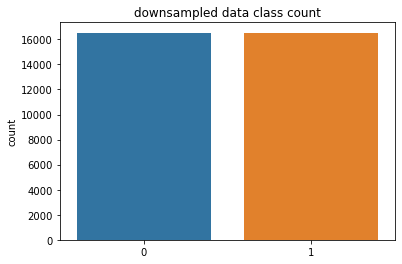

In [21]:
y=downsampled.isFraud.value_counts()
sns.barplot(y=y,x=[0,1])
plt.title('downsampled data class count')
plt.ylabel('count')

In [22]:
X11 = downsampled.drop(columns=['isFraud'])

In [23]:
y11 = downsampled['isFraud']

In [24]:
y11.shape

(33058,)

In [25]:
X11.dtypes.unique()

array([dtype('int32'), dtype('float16'), dtype('O'), dtype('int16'),
       dtype('float32')], dtype=object)

In [26]:
ct = ColumnTransformer([('sp',sp,make_column_selector(dtype_include=['O','object','string'])),('sp2',sp2,make_column_selector(dtype_include=['int32','float16','int16','float32']))])

In [27]:
ctn = ct.fit_transform(X11)

In [28]:
#ctn_df.iloc[:5,50]

In [29]:
ctn_df = pd.DataFrame(ctn, columns = X11.columns)

In [ ]:
pd.set_option('display.max_rows', 1000)
pd.set_option('display.max_columns', 10)
pd.set_option('display.width', 10)

We will review other resampling techniques.

In [30]:
ctn_df.shape

(33058, 434)



For ease of visualization, let's create a small unbalanced sample dataset using the make_classification method:


In [ ]:
from sklearn.datasets import make_classification

X, y = make_classification(
    n_classes=2, class_sep=1.5, weights=[0.9, 0.1],
    n_informative=3, n_redundant=1, flip_y=0,
    n_features=20, n_clusters_per_class=1,
    n_samples=1000, random_state=10
)

df = pd.DataFrame(X)
df['target'] = y
df.target.value_counts().plot(kind='bar', title='Count (target)')

In [31]:
ctn_df1 = ctn_df.convert_dtypes()

In [32]:
ctn_df1.shape

(33058, 434)

In [ ]:
ctn_df1.to_csv('final_file',index=False)

In [33]:
ctn_df1.dtypes.unique()

array([StringDtype, Int64Dtype(), dtype('float64')], dtype=object)

In [34]:

# instantiate a Dictvectorizer object for X
dv_X = DictVectorizer(sparse=False) 
# sparse = False makes the output is not a sparse matrix

In [35]:
# turn X into dict
X_dict = ctn_df1.to_dict(orient='records') # turn each row as key-value pairs
# show X_dict
X_dict

[{'TransactionID_x': 'S',
  'TransactionDT': 'mastercard',
  'TransactionAmt': 'debit',
  'ProductCD': 'gmail.com',
  'card1': 'gmail.com',
  'card2': 'T',
  'card3': 'T',
  'card4': 'T',
  'card5': 'M0',
  'card6': 'F',
  'addr1': 'F',
  'addr2': 'F',
  'dist1': 'F',
  'dist2': 'T',
  'P_emaildomain': 'NotFound',
  'R_emaildomain': 'New',
  'C1': 'NotFound',
  'C2': 'IP_PROXY:TRANSPARENT',
  'C3': 'Found',
  'C4': 'New',
  'C5': 'NotFound',
  'C6': 'Mac OS X 10_11_6',
  'C7': 'chrome 63.0',
  'C8': '2880x1800',
  'C9': 'match_status:2',
  'C10': 'T',
  'C11': 'F',
  'C12': 'T',
  'C13': 'T',
  'C14': 'desktop',
  'D1': 'MacOS',
  'D2': 3066650,
  'D3': 1721406,
  'D4': 15.0,
  'D5': 15111,
  'D6': 310,
  'D7': 150,
  'D8': 224,
  'D9': 204,
  'D10': 87,
  'D11': 9,
  'D12': 285,
  'D13': 4,
  'D14': 4,
  'D15': 0,
  'M1': 5,
  'M2': 0,
  'M3': 0,
  'M4': 0,
  'M5': 12,
  'M6': 0,
  'M7': 10,
  'M8': 3,
  'M9': 0,
  'V1': 17,
  'V2': 4,
  'V3': 443,
  'V4': 443,
  'V5': 3,
  'V6': 5,
 

In [36]:
# apply dv_X on X_dict
X_encoded = dv_X.fit_transform(X_dict)
# show X_encoded


In [37]:
# vocabulary
vocab = dv_X.vocabulary_
# show vocab
key =  vocab.keys()
key =  list(key)


In [38]:
X_encoded_df =  pd.DataFrame(X_encoded, columns =key)

In [39]:
X_encoded_df.head()

,TransactionID_x=S,TransactionDT=mastercard,TransactionAmt=debit,ProductCD=gmail.com,card1=gmail.com,card2=T,card3=T,card4=T,card5=M0,card6=F,...,D1=iris702,C8=960x540,D1=XT1528,D1=rv:47.0,D1=ONE TOUCH 4016A Build/JDQ39,D1=SAMSUNG SM-G930P Build/NRD90M,D1=HUAWEI VNS-L31 Build/HUAWEIVNS-L31,D1=D6603 Build/23.5.A.1.291,D1=SAMSUNG SM-G900A Build/MMB29M,D1=Z835 Build/NMF26V
0,0.0,1.0,1.0,0.0,0.0,1.0,0.0,1.0,1.0,0.0,...,41.0,-300.0,166.0,13.0,100.0,533.0,252.0,14.0,11.0,321.0
1,0.0,1.0,1.0,0.0,0.0,1.0,1.0,0.0,1.0,0.0,...,52.0,-300.0,166.0,15.0,341.0,479.5,252.0,14.0,11.0,321.0
2,0.0,1.0,1.0,0.0,0.0,1.0,1.0,0.0,1.0,0.0,...,52.0,-300.0,166.0,15.0,341.0,479.5,252.0,14.0,11.0,321.0
3,0.0,1.0,1.0,0.0,0.0,1.0,1.0,0.0,1.0,0.0,...,52.0,-300.0,166.0,15.0,341.0,479.5,252.0,14.0,11.0,321.0
4,0.0,1.0,1.0,0.0,0.0,1.0,1.0,0.0,1.0,0.0,...,52.0,-300.0,166.0,15.0,341.0,479.5,252.0,14.0,11.0,321.0


In [56]:
X_encoded_df.to_csv('final_encoded.csv',index=False)

In [40]:
scaler = StandardScaler()

scaler.fit(X_encoded_df)

StandardScaler()

In [41]:
X_encoded_scaled = scaler.transform(X_encoded_df)

- We will do an experiment with this data without any resampling technique.
- We will fit and predict the data on a Logistic regression model and observe the output scores.

In [40]:
X_encoded_scaled = pd.DataFrame(X_encoded_scaled,columns= X_encoded_df.columns)

In [41]:
X_encoded_scaled.head()

,TransactionID_x=S,TransactionDT=mastercard,TransactionAmt=debit,ProductCD=gmail.com,card1=gmail.com,...,D1=SAMSUNG SM-G930P Build/NRD90M,D1=HUAWEI VNS-L31 Build/HUAWEIVNS-L31,D1=D6603 Build/23.5.A.1.291,D1=SAMSUNG SM-G900A Build/MMB29M,D1=Z835 Build/NMF26V
0,-0.31904,0.31904,0.105662,-0.105662,-0.217713,...,0.917202,-0.044737,-0.025775,-0.044225,-0.006268
1,-0.31904,0.31904,0.105662,-0.105662,-0.217713,...,0.203085,-0.044737,-0.025775,-0.044225,-0.006268
2,-0.31904,0.31904,0.105662,-0.105662,-0.217713,...,0.203085,-0.044737,-0.025775,-0.044225,-0.006268
3,-0.31904,0.31904,0.105662,-0.105662,-0.217713,...,0.203085,-0.044737,-0.025775,-0.044225,-0.006268
4,-0.31904,0.31904,0.105662,-0.105662,-0.217713,...,0.203085,-0.044737,-0.025775,-0.044225,-0.006268


In [42]:
var = VarianceThreshold(0.99)
X_var = var.fit(X_encoded_df)

In [43]:
X_var_trans = var.transform(X_encoded_df)

In [44]:
X_var_trans.shape

(33058, 219)

In [45]:
X_encoded_df.shape

(33058, 1350)

In [46]:
data_transformed = X_encoded_df.loc[:, X_var.get_support()]


In [47]:
data_transformed.columns

Index(['V220', 'V221', 'V222', 'V223', 'V224', 'C6=iOS 9.3.5',
       'D1=LG-H870 Build/NRD90U', 'D1=5015A Build/LMY47I', 'C8=2160x1440',
       'D1=M4 SS4451 Build/LMY47D',
       ...
       'D1=Z9 PLUS Build/NRD90M', 'D1=SM-G930T Build/NRD90M',
       'D1=HUAWEI GRA-L09 Build/HUAWEIGRA-L09', 'D1=iris702', 'C8=960x540',
       'D1=XT1528', 'D1=ONE TOUCH 4016A Build/JDQ39',
       'D1=SAMSUNG SM-G930P Build/NRD90M',
       'D1=HUAWEI VNS-L31 Build/HUAWEIVNS-L31', 'D1=Z835 Build/NMF26V'],
      dtype='object', length=219)

In [48]:
#model_extratree = RandomForestClassifier(max_depth=2, random_state=0)
data_transformed

,V220,V221,V222,V223,V224,C6=iOS 9.3.5,D1=LG-H870 Build/NRD90U,D1=5015A Build/LMY47I,C8=2160x1440,D1=M4 SS4451 Build/LMY47D,...,D1=Z9 PLUS Build/NRD90M,D1=SM-G930T Build/NRD90M,D1=HUAWEI GRA-L09 Build/HUAWEIGRA-L09,D1=iris702,C8=960x540,D1=XT1528,D1=ONE TOUCH 4016A Build/JDQ39,D1=SAMSUNG SM-G930P Build/NRD90M,D1=HUAWEI VNS-L31 Build/HUAWEIVNS-L31,D1=Z835 Build/NMF26V
0,87.0,9.0,285.0,4.0,4.0,3066650.0,1721406.0,15.000000,15111.0,310.0,...,0.0,0.0,-33.0,41.0,-300.0,166.0,100.0,533.0,252.0,321.0
1,87.0,0.0,40.0,2.0,1.0,3224714.0,5610189.0,32.500000,8469.0,298.0,...,0.0,0.0,-33.0,52.0,-300.0,166.0,341.0,479.5,252.0,321.0
2,87.0,9.0,40.0,1.0,1.0,3495520.0,13310750.0,59.000000,7919.0,194.0,...,0.0,0.0,-33.0,52.0,-300.0,166.0,341.0,479.5,252.0,321.0
3,87.0,2.0,40.0,1.0,2.0,3557826.0,15164286.0,141.000000,9002.0,453.0,...,0.0,0.0,-33.0,52.0,-300.0,166.0,341.0,479.5,252.0,321.0
4,87.0,13.0,40.0,1.0,1.0,3170197.0,4054258.0,226.000000,12577.0,268.0,...,0.0,0.0,-33.0,52.0,-300.0,166.0,341.0,479.5,252.0,321.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
33053,87.0,108.0,40.0,13.0,11.0,3065896.0,1714052.0,54.000000,7744.0,417.0,...,0.0,0.0,-33.0,52.0,-300.0,225.0,427.0,127.0,252.0,321.0
33054,87.0,6.0,40.0,1.0,1.0,3215120.0,5412228.0,160.000000,6054.0,327.0,...,0.0,0.0,-33.0,52.0,-300.0,166.0,341.0,479.5,252.0,321.0
33055,87.0,9.0,421.0,126.0,122.0,3159423.0,3721091.0,20.515625,9633.0,296.0,...,0.0,0.0,-33.0,52.0,-300.0,166.0,341.0,479.5,252.0,321.0
33056,87.0,9.0,40.0,1.0,1.0,2987243.0,90246.0,37.093750,13413.0,103.0,...,-3.0,-14.0,-33.0,52.0,-300.0,225.0,384.0,507.0,252.0,321.0


In [49]:
# feature extraction
#model = LogisticRegression(solver='lbfgs')
model =xgb.XGBClassifier(random_state=1,learning_rate = 0.1)

rfe = RFE(model,n_features_to_select=60)
fit = rfe.fit(data_transformed, y11)
print("Num Features: %d" % fit.n_features_)
print("Selected Features: %s" % fit.support_)
print("Feature Ranking: %s" % fit.ranking_)

Num Features: 60
Selected Features: [False  True False  True  True  True False  True  True  True  True  True
  True False False  True  True  True  True  True  True  True  True  True
  True  True False False  True False False False  True False  True  True
 False False False  True False False False False  True False  True False
 False  True False False False False False False False False False False
 False False  True False False False  True False False False False False
 False False False False False False False False False  True False False
  True False False False False False False  True False False False False
 False False False False False False False False False False False False
 False False False False False False False False False False False False
 False False False False  True False False False False  True False  True
 False False False False False False False False False False False False
 False False False False False False False  True  True  True False False
 False False Fa

In [51]:
data_transformed.head()

,V220,V221,V222,V223,V224,C6=iOS 9.3.5,D1=LG-H870 Build/NRD90U,D1=5015A Build/LMY47I,C8=2160x1440,D1=M4 SS4451 Build/LMY47D,...,D1=Z9 PLUS Build/NRD90M,D1=SM-G930T Build/NRD90M,D1=HUAWEI GRA-L09 Build/HUAWEIGRA-L09,D1=iris702,C8=960x540,D1=XT1528,D1=ONE TOUCH 4016A Build/JDQ39,D1=SAMSUNG SM-G930P Build/NRD90M,D1=HUAWEI VNS-L31 Build/HUAWEIVNS-L31,D1=Z835 Build/NMF26V
0,87.0,9.0,285.0,4.0,4.0,3066650.0,1721406.0,15.0,15111.0,310.0,...,0.0,0.0,-33.0,41.0,-300.0,166.0,100.0,533.0,252.0,321.0
1,87.0,0.0,40.0,2.0,1.0,3224714.0,5610189.0,32.5,8469.0,298.0,...,0.0,0.0,-33.0,52.0,-300.0,166.0,341.0,479.5,252.0,321.0
2,87.0,9.0,40.0,1.0,1.0,3495520.0,13310750.0,59.0,7919.0,194.0,...,0.0,0.0,-33.0,52.0,-300.0,166.0,341.0,479.5,252.0,321.0
3,87.0,2.0,40.0,1.0,2.0,3557826.0,15164286.0,141.0,9002.0,453.0,...,0.0,0.0,-33.0,52.0,-300.0,166.0,341.0,479.5,252.0,321.0
4,87.0,13.0,40.0,1.0,1.0,3170197.0,4054258.0,226.0,12577.0,268.0,...,0.0,0.0,-33.0,52.0,-300.0,166.0,341.0,479.5,252.0,321.0


In [150]:
data_transformed['V220'][0]

87.0

In [61]:
rfe_ds1_scaled.shape

(33058, 60)

In [62]:
rfe_ds1  = data_transformed.loc[:,fit.support_]
rfe_ds1.shape

(33058, 60)

In [63]:
#data_transformed[data_transformed['V220'] == 87.0]
sc = StandardScaler()
rfe_ds1_scaled =  sc.fit_transform(rfe_ds1)

In [53]:
rfe_ds1.to_csv('rfe_ds1.csv',index =False)

In [111]:
#rfe_ds.columns
rfe_ds1_scaled.shape

(33058, 60)

In [55]:
rfe_ds1.columns

Index(['V221', 'V223', 'V224', 'C6=iOS 9.3.5', 'D1=5015A Build/LMY47I',
       'C8=2160x1440', 'D1=M4 SS4451 Build/LMY47D', 'D1=SM-A510M Build/MMB29K',
       'C7=google', 'D1=WAS-LX1A Build/HUAWEIWAS-LX1A', 'C7=chrome 51.0',
       'D1=SM-J120H Build/LMY47V', 'C6=Mac OS X 10_12_4', 'C6=Mac OS X 10.10',
       'C7=chrome 56.0 for android', 'D1=Z970',
       'D1=HTC Desire 626s Build/LMY47O', 'C6=Mac OS X 10_12_3',
       'C7=edge 17.0', 'ProductCD=servicios-ta.com', 'card1=servicios-ta.com',
       'card1=gmail', 'D1=Hisense U963 Build/MRA58K', 'D1=5056A Build/MMB29M',
       'D1=HTC One M9 Build/NRD90M', 'C7=mobile', 'D1=P00C',
       'D1=SM-A520F Build/NRD90M', 'C8=2048x1152', 'C7=chrome 57.0',
       'D1=Pixel', 'D1=SM-J700M Build/LMY48B',
       'D1=MotoG3 Build/MPI24.65-33.1-2',
       'D1=Moto G Play Build/MPIS24.241-15.3-26', 'D1=RS988 Build/MMB29M',
       'D1=SAMSUNG SM-G955F Build/R16NW', 'D1=P5046A',
       'D1=Moto G (4) Build/NPJS25.93-14-18', 'D1=Hisense F23 Build/NRD90M'





## [Dimensionality Reduction and Clustering](#7)<a id="7"></a> <br>

Understanding t-SNE:
In order to understand this algorithm you have to understand the following terms:

    Euclidean Distance
    Conditional Probability
    Normal and T-Distribution Plots



In the below section we will implement three major dimensionality reduction algorithms
- **T-sne**
- **PCA**
- **Truncated SVD**

In [73]:
#T-SNE Implementation
t0 = time.time()
X_reduced_tsne = TSNE(n_components=2, random_state=42).fit_transform(rfe_ds1_scaled)
t1 = time.time()
print("T-SNE took {:.2} s".format(t1 - t0))


T-SNE took 3.4e+02 s


In [64]:

# PCA Implementation
pc = PCA(n_components=50)

In [65]:
pcf = pc.fit(rfe_ds1_scaled)

In [67]:
X_reduced_pca = pc.transform(rfe_ds1_scaled)

In [68]:
#pcf.explained_variance_ratio_
pcf.explained_variance_ratio_.cumsum()

array([0.17428209, 0.33045446, 0.41505825, 0.48697906, 0.54682769,
       0.58584431, 0.61892755, 0.64631416, 0.66637146, 0.68599816,
       0.7043439 , 0.72239196, 0.73958115, 0.75670651, 0.77343097,
       0.78993905, 0.80584956, 0.82151595, 0.83684802, 0.85194259,
       0.86625482, 0.8800023 , 0.89258395, 0.90454244, 0.91571348,
       0.92602365, 0.93491909, 0.94321697, 0.95058292, 0.95764909,
       0.96385856, 0.96864214, 0.97278958, 0.97684531, 0.98069621,
       0.98417386, 0.98705384, 0.9897927 , 0.99184075, 0.99340821,
       0.99474793, 0.99584421, 0.9966463 , 0.99738527, 0.9980236 ,
       0.99858062, 0.9990825 , 0.99937267, 0.99954466, 0.99965554])

In [69]:
len(X_reduced_pca)

33058

In [70]:
import seaborn as sns 
y11

79650     0
237714    0
508520    0
570826    0
183197    0
         ..
78896     1
228120    1
172423    1
243       1
73349     1
Name: isFraud, Length: 33058, dtype: uint8

In [72]:
# TruncatedSVD
t0 = time.time()
X_reduced_svd = TruncatedSVD(n_components=2, algorithm='randomized', random_state=42).fit_transform(rfe_ds1_scaled)
t1 = time.time()
print("Truncated SVD took {:.2} s".format(t1 - t0))

Truncated SVD took 0.08 s


Now we will visualize the output of the above three algorithms in a 2D space.

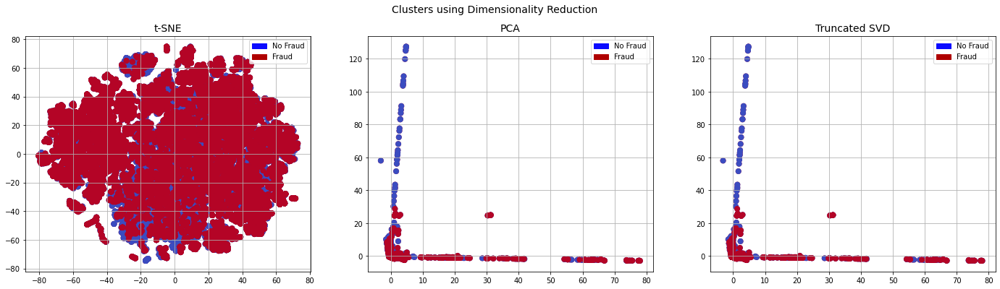

In [74]:
f, (ax1, ax2, ax3) = plt.subplots(1, 3, figsize=(24,6))
#labels = ['No Fraud', 'Fraud']
blue_patch = mpatches.Patch(color='#0A0AFF', label='No Fraud')
red_patch = mpatches.Patch(color='#AF0000', label='Fraud')



f.suptitle('Clusters using Dimensionality Reduction', fontsize=14)


blue_patch = mpatches.Patch(color='#0A0AFF', label='No Fraud')
red_patch = mpatches.Patch(color='#AF0000', label='Fraud')


# t-SNE scatter plot
ax1.scatter(X_reduced_tsne[:,0], X_reduced_tsne[:,1], c=(y11 == 0), cmap='coolwarm', label='No Fraud', linewidths=2)
ax1.scatter(X_reduced_tsne[:,0], X_reduced_tsne[:,1], c=(y11 == 1), cmap='coolwarm', label='Fraud', linewidths=2)
ax1.set_title('t-SNE', fontsize=14)

ax1.grid(True)

ax1.legend(handles=[blue_patch, red_patch])

# PCA scatter plot
ax2.scatter(X_reduced_pca[:,0], X_reduced_pca[:,1], c=(y11 == 0), cmap='coolwarm', label='No Fraud', linewidths=2)
ax2.scatter(X_reduced_pca[:,0], X_reduced_pca[:,1], c=(y11 == 1), cmap='coolwarm', label='Fraud', linewidths=2)
ax2.set_title('PCA', fontsize=14)

ax2.grid(True)

ax2.legend(handles=[blue_patch, red_patch])

# TruncatedSVD scatter plot
ax3.scatter(X_reduced_svd[:,0], X_reduced_svd[:,1], c=(y11 == 0), cmap='coolwarm', label='No Fraud', linewidths=2)
ax3.scatter(X_reduced_svd[:,0], X_reduced_svd[:,1], c=(y11 == 1), cmap='coolwarm', label='Fraud', linewidths=2)
ax3.set_title('Truncated SVD', fontsize=14)

ax3.grid(True)

ax3.legend(handles=[blue_patch, red_patch])

plt.show()


# Modeling

In [179]:
def plot_pre_curve(y_test,probs):
    precision, recall, thresholds = precision_recall_curve(y_test, probs)
    plt.plot([0, 1], [0.5, 0.5], linestyle='--')
    # plot the precision-recall curve for the model
    plt.plot(recall, precision, marker='.')
    plt.title("precision recall curve")
    plt.xlabel('Recall')
    plt.ylabel('Precision')
    # show the plot
    plt.show()
    
def plot_roc(y_test,prob):
    fpr, tpr, thresholds = roc_curve(y_test, probs)
    #print(fpr,tpr,thresholds)
    # plot no skill
    plt.plot([0, 1], [0, 1], linestyle='--')
    # plot the roc curve for the model
    plt.plot(fpr, tpr, marker='.')
    plt.title("ROC curve")
    plt.xlabel('false positive rate')
    plt.ylabel('true positive rate')
    # show the plot
    plt.show()

## Logistic Regression

In [115]:
X_train,X_test,y_train,y_test=train_test_split(rfe_ds1_scaled,y11,test_size=.2,random_state=1,stratify=y11)
lr=LogisticRegression()
lr.fit(X_train,y_train)
prob_lr=lr.predict_proba(X_test)
pred_lr=lr.predict(X_test)
probs_lr,y_test = (prob_lr[:,1],y_test)
    

C:\Users\manik\anaconda3\lib\site-packages\sklearn\linear_model\_logistic.py:762: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(


In [116]:
accuracy_score(y_test,pred_lr)

0.7433454325468845

## Random Forest Classifier

In [117]:
rf = RandomForestClassifier(max_depth=2, random_state=0)
rf.fit(X_train, y_train)


RandomForestClassifier(max_depth=2, random_state=0)

In [118]:
pred_rf = rf.predict(X_test)

In [119]:
accuracy_score(y_test,pred_rf)

0.7542347247428917

In [238]:
columns = pd.Series(rf.feature_importances_,index = rfe_ds.columns)

In [242]:
columns = columns.sort_values(ascending= False)

## KNeighborsClassifier

In [120]:
from sklearn.neighbors import KNeighborsClassifier
knn = KNeighborsClassifier(n_neighbors=5) 

In [121]:
knn.fit(X_train,y_train)

KNeighborsClassifier()

In [122]:
pred_knn = knn.predict(X_test)

In [123]:
accuracy_score(y_test,pred_knn)

0.7767695099818511

## SVM 

In [124]:

#read the train and test dataset



svc = SVC(C=1.0, kernel='rbf')
svc.fit(X_train, y_train)


SVC()

In [125]:
pred_svc = svc.predict(X_test)

In [126]:
accuracy_score(y_test,pred_svc)

0.7661826981246219

## GaussianNB

In [129]:
from sklearn.naive_bayes import GaussianNB

nb = GaussianNB()

# fit the model with the training data
nb.fit(X_train,y_train)


GaussianNB()

In [130]:
pred_nb = nb.predict(X_test)
print('Target on test data',pred_nb) 

# Accuracy Score on test dataset
accuracy_pred_nb = accuracy_score(y_test,pred_nb)
print('accuracy_score of Gaussian NaiveBayes on test dataset : ', accuracy_pred_nb)

Target on test data [0 0 1 ... 1 0 1]
accuracy_score of Gaussian NaiveBayes on test dataset :  0.6205384150030248


In [131]:

# predict the target on the test dataset
predict_test = nb.predict(X_test)
print('Target on test data',predict_test) 

# Accuracy Score on test dataset
accuracy_test = accuracy_score(y_test,predict_test)
print('accuracy_score on test dataset : ', accuracy_test)


Target on test data [0 0 1 ... 1 0 1]
accuracy_score on test dataset :  0.6205384150030248


## Cross validation

In [134]:
kfold = StratifiedKFold(n_splits=5, random_state=7,shuffle=True)
results = cross_val_score(model_xgb, rfe_ds1_scaled, y11, cv=kfold, scoring = make_scorer(accuracy_score))
print("Accuracy: %.2f%% (%.2f%%)" % (results.mean()*100, results.std()*100))

Accuracy: 83.47% (0.44%)


## XGBoost

In [135]:
model_xgb =xgb.XGBClassifier(random_state=1,learning_rate = 0.1)
model_xgb.fit(X_train,y_train)



XGBClassifier(base_score=0.5, booster='gbtree', colsample_bylevel=1,
              colsample_bynode=1, colsample_bytree=1, gamma=0, gpu_id=-1,
              importance_type='gain', interaction_constraints='',
              learning_rate=0.1, max_delta_step=0, max_depth=6,
              min_child_weight=1, missing=nan, monotone_constraints='()',
              n_estimators=100, n_jobs=0, num_parallel_tree=1, random_state=1,
              reg_alpha=0, reg_lambda=1, scale_pos_weight=1, subsample=1,
              tree_method='exact', validate_parameters=1, verbosity=None)

In [136]:
pred_xgb = model_xgb.predict(X_test)


In [137]:
#print("accuracy score of xgboost is %d"
accuracy_score(y_test,pred_xgb)

0.838173018753781

## Hyperparameter Tuning

In [166]:
X_train,X_test,y_train,y_test=train_test_split(rfe_ds1,y11,test_size=.2,random_state=1,stratify=y11)

kfold = StratifiedKFold(n_splits=5, random_state=7,shuffle=True)


clf_xgb = XGBClassifier(objective = 'binary:logistic')
param_dist = {'n_estimators': [100],
              'learning_rate': [0.1],
              'max_depth': [11],
              'subsample': [0.6,0.7],
              colsample_bytree': [0.5, 0.45]
#            'subsample': [0.3,0.4,0.6, 0.7],
#             'max_depth': [3, 4, 5, 6, 7, 8, 9],
#            'colsample_bytree': [0.5, 0.45],
#              'min_child_weight': [1, 2, 3]
             }
clf = GridSearchCV(clf_xgb, param_grid = param_dist,  scoring = make_scorer(accuracy_score),  verbose = 3, n_jobs = -1, cv =kfold)


#https://xgboost.readthedocs.io/en/latest/parameter.html

In [167]:
clf.fit(X_train,y_train)

Fitting 5 folds for each of 2 candidates, totalling 10 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 12 concurrent workers.
[Parallel(n_jobs=-1)]: Done   3 out of  10 | elapsed:   23.6s remaining:   55.2s
[Parallel(n_jobs=-1)]: Done   7 out of  10 | elapsed:   23.8s remaining:   10.2s
[Parallel(n_jobs=-1)]: Done  10 out of  10 | elapsed:   24.2s finished


GridSearchCV(cv=StratifiedKFold(n_splits=5, random_state=7, shuffle=True),
             estimator=XGBClassifier(base_score=None, booster=None,
                                     colsample_bylevel=None,
                                     colsample_bynode=None,
                                     colsample_bytree=None, gamma=None,
                                     gpu_id=None, importance_type='gain',
                                     interaction_constraints=None,
                                     learning_rate=None, max_delta_step=None,
                                     max_depth=None, min_child_weight=None,
                                     missing...ne,
                                     n_estimators=100, n_jobs=None,
                                     num_parallel_tree=None, random_state=None,
                                     reg_alpha=None, reg_lambda=None,
                                     scale_pos_weight=None, subsample=None,
                        

In [168]:
clf.best_params_

{'learning_rate': 0.1, 'max_depth': 11, 'n_estimators': 100, 'subsample': 0.7}

In [169]:
clf_pred = clf.predict(X_test)

In [170]:
accuracy_score(y_test,clf_pred)

0.8628251663641864

In [171]:
#clf.cv_results_
clf_proba = clf.predict_proba(X_test)
clf_proba[:,1]
roc_auc_score(y_test,clf_proba[:,1])

0.9391885512015222

In [172]:
confusion_matrix(y_test,clf_pred)

array([[2942,  364],
       [ 543, 2763]], dtype=int64)

In [174]:
#model.fit(X_train, y_train)
#model.score(X_test,y_test)
#pred = model.predict(X_test)
#print(accuracy_score(y_test,pred))
#print(confusion_matrix(y_test,pred))
#print(recall_score(y_test,pred))

In [175]:
print(classification_report(y_test,clf_pred))

              precision    recall  f1-score   support

           0       0.84      0.89      0.87      3306
           1       0.88      0.84      0.86      3306

    accuracy                           0.86      6612
   macro avg       0.86      0.86      0.86      6612
weighted avg       0.86      0.86      0.86      6612



- We will define two functions to plot precision_recall curve and roc curve

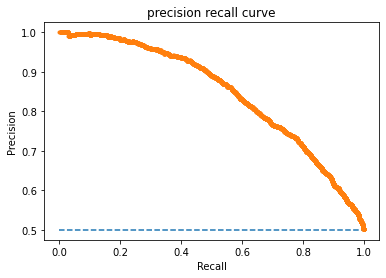

In [180]:
plot_pre_curve(y_test,probs_lr)


In [186]:
prob_knn=knn.predict_proba(X_test)


In [191]:
prob_knn

array([[0., 1.],
       [0., 1.],
       [0., 1.],
       ...,
       [0., 1.],
       [0., 1.],
       [0., 1.]])

In [181]:
clf.cv_results_['mean_test_score']

array([0.85381533, 0.85600824])

In [ ]:
X_train,X_test,y_train,y_test=train_test_split(rfe_ds1_scaled,y11,test_size=.2,random_state=1,stratify=y11)
lr=LogisticRegression()
lr.fit(X_train,y_train)
prob_lr=lr.predict_proba(X_test)
pred_lr=lr.predict(X_test)
probs_lr,y_test = (prob_lr[:,1],y_test)
    

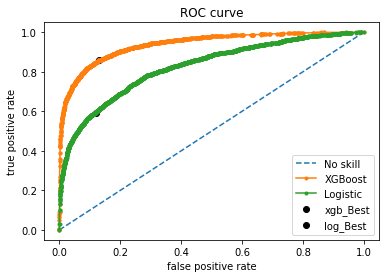

Best Threshold for XGBoost classifier=0.443960, G-Mean=0.865
Best Threshold for Logistic classifier=0.560071, G-Mean=0.748


In [202]:
fpr, tpr, thresholds = roc_curve(y_test,clf_proba[:,1] )
fpr_lr, tpr_lr, thresholds_lr = roc_curve(y_test,probs_lr)
gmeans = np.sqrt(tpr * (1-fpr))
gmeans_l = np.sqrt(tpr_lr * (1-fpr_lr))
ix =np.argmax(gmeans)
ix_l =np.argmax(gmeans_l)
# plot no skill
plt.plot([0, 1], [0, 1], linestyle='--',label='No skill')
# plot the roc curve for the model
plt.plot(fpr, tpr, marker='.',label='XGBoost')
plt.scatter(fpr[ix], tpr[ix], marker='o', color='black', label='xgb_Best')

plt.plot(fpr_lr, tpr_lr, marker='.',label='Logistic')
plt.scatter(fpr_lr[ix], tpr_lr[ix], marker='o', color='black', label='log_Best')

plt.title("ROC curve")
plt.xlabel('false positive rate')
plt.ylabel('true positive rate')
plt.legend()
plt.show()

print('Best Threshold for XGBoost classifier=%f, G-Mean=%.3f' % (thresholds[ix], gmeans[ix]))
print('Best Threshold for Logistic classifier=%f, G-Mean=%.3f' % (thresholds_lr[ix], gmeans_l[ix_l]))


## Threshold Tuning



In [203]:
def to_labels(pos_probs, threshold):
    return (pos_probs >= threshold).astype('int')

In [205]:
clf_pred_new = to_labels(clf_proba[:,1],0.44)

In [214]:
accuracy_score(y_test,clf_pred_new)

0.8640350877192983

In [222]:
print('accuracy score of XGBoost after threshold tuning is {}'.format(accuracy_score(y_test,clf_pred_new)))

accuracy score of XGBoost after threshold tuning is 0.8640350877192983


# Hence accuracy has been improved a bit by tuning threshold. However, XGBoost already did its best because of balanced dataset